<a href="https://colab.research.google.com/github/mahapara2411/devopsgit/blob/main/Customer_Targeting_%26_Sales_Forecasting.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
from math import ceil

from sklearn.cluster import KMeans
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.manifold import TSNE
import plotly
plotly.offline.init_notebook_mode(connected=True)

from ipywidgets import interact, interactive, fixed, interact_manual,VBox,HBox,Layout
import ipywidgets as widgets

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Retail_Dataset.xlsx to Retail_Dataset.xlsx


In [2]:
df = pd.read_excel("Retail_Dataset.xlsx", sheet_name = ["Year 2009-2010", "Year 2010-2011"])

In [3]:
df1 = df["Year 2009-2010"]
df2 = df["Year 2010-2011"]

In [4]:
sum([df1.shape[0], df2.shape[0]])

1067371

In [5]:
data = df1.append(df2)

In [6]:
data.head()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,CustomerID,Country
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01 07:45:00,6.95,13085.0,United Kingdom
1,489434,79323P,PINK CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom
2,489434,79323W,WHITE CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom
3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48,2009-12-01 07:45:00,2.10,13085.0,United Kingdom
4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01 07:45:00,1.25,13085.0,United Kingdom


In [7]:
# Cancelled Orders - Does not count towards revenue stream.

cancel_df = data[data['Invoice'].str.contains('C', na = False)]
cancel_df.reset_index(drop=True)

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,CustomerID,Country
0,C489449,22087,PAPER BUNTING WHITE LACE,-12,2009-12-01 10:33:00,2.95,16321.0,Australia
1,C489449,85206A,CREAM FELT EASTER EGG BASKET,-6,2009-12-01 10:33:00,1.65,16321.0,Australia
2,C489449,21895,POTTING SHED SOW 'N' GROW SET,-4,2009-12-01 10:33:00,4.25,16321.0,Australia
3,C489449,21896,POTTING SHED TWINE,-6,2009-12-01 10:33:00,2.10,16321.0,Australia
4,C489449,22083,PAPER CHAIN KIT RETRO SPOT,-12,2009-12-01 10:33:00,2.95,16321.0,Australia
...,...,...,...,...,...,...,...,...
19489,C581490,23144,ZINC T-LIGHT HOLDER STARS SMALL,-11,2011-12-09 09:57:00,0.83,14397.0,United Kingdom
19490,C581499,M,Manual,-1,2011-12-09 10:28:00,224.69,15498.0,United Kingdom
19491,C581568,21258,VICTORIAN SEWING BOX LARGE,-5,2011-12-09 11:57:00,10.95,15311.0,United Kingdom
19492,C581569,84978,HANGING HEART JAR T-LIGHT HOLDER,-1,2011-12-09 11:58:00,1.25,17315.0,United Kingdom


In [8]:
trans_df = data[~data['Invoice'].str.contains('C', na = False)]
trans_df.reset_index(drop=True)

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,CustomerID,Country
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01 07:45:00,6.95,13085.0,United Kingdom
1,489434,79323P,PINK CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom
2,489434,79323W,WHITE CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom
3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48,2009-12-01 07:45:00,2.10,13085.0,United Kingdom
4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01 07:45:00,1.25,13085.0,United Kingdom
...,...,...,...,...,...,...,...,...
1047872,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680.0,France
1047873,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680.0,France
1047874,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680.0,France
1047875,581587,22138,BAKING SET 9 PIECE RETROSPOT,3,2011-12-09 12:50:00,4.95,12680.0,France


In [9]:
bad_debt = trans_df[trans_df.Invoice.str.contains('A', na = False)]
bad_debt

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,CustomerID,Country
179403,A506401,B,Adjust bad debt,1,2010-04-29 13:36:00,-53594.36,NaN,United Kingdom
276274,A516228,B,Adjust bad debt,1,2010-07-19 11:24:00,-44031.79,NaN,United Kingdom
403472,A528059,B,Adjust bad debt,1,2010-10-20 12:04:00,-38925.87,NaN,United Kingdom
299982,A563185,B,Adjust bad debt,1,2011-08-12 14:50:00,11062.06,NaN,United Kingdom
299983,A563186,B,Adjust bad debt,1,2011-08-12 14:51:00,-11062.06,NaN,United Kingdom
299984,A563187,B,Adjust bad debt,1,2011-08-12 14:52:00,-11062.06,NaN,United Kingdom


In [10]:
trans_df[trans_df['Price']<0]

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,CustomerID,Country
179403,A506401,B,Adjust bad debt,1,2010-04-29 13:36:00,-53594.36,NaN,United Kingdom
276274,A516228,B,Adjust bad debt,1,2010-07-19 11:24:00,-44031.79,NaN,United Kingdom
403472,A528059,B,Adjust bad debt,1,2010-10-20 12:04:00,-38925.87,NaN,United Kingdom
299983,A563186,B,Adjust bad debt,1,2011-08-12 14:51:00,-11062.06,NaN,United Kingdom
299984,A563187,B,Adjust bad debt,1,2011-08-12 14:52:00,-11062.06,NaN,United Kingdom


In [11]:
# Filtering the Adjusted bad debt data and transactions where price equal to 0.
trans_df = trans_df[~trans_df.Invoice.str.contains('A', na = False)]
trans_df = trans_df[trans_df['Price']!=0]
trans_df.reset_index(drop=True)

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,CustomerID,Country
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01 07:45:00,6.95,13085.0,United Kingdom
1,489434,79323P,PINK CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom
2,489434,79323W,WHITE CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom
3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48,2009-12-01 07:45:00,2.10,13085.0,United Kingdom
4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01 07:45:00,1.25,13085.0,United Kingdom
...,...,...,...,...,...,...,...,...
1041664,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680.0,France
1041665,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680.0,France
1041666,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680.0,France
1041667,581587,22138,BAKING SET 9 PIECE RETROSPOT,3,2011-12-09 12:50:00,4.95,12680.0,France


In [12]:
trans_df['InvoiceDate']=pd.to_datetime(trans_df['InvoiceDate'])
trans_df['Sales'] = trans_df.Quantity*trans_df.Price
trans_df['Year']=trans_df.InvoiceDate.dt.year
trans_df['Month']=trans_df.InvoiceDate.dt.month
trans_df['Week']=trans_df.InvoiceDate.dt.isocalendar().week
trans_df['Year_Month']=trans_df.InvoiceDate.dt.to_period('M')
trans_df['Hour']=trans_df.InvoiceDate.dt.hour
trans_df['Day']=trans_df.InvoiceDate.dt.day
#data['is_cancelled']=data.Invoice.apply(lambda x: 'Yes' if x[0]=='C' else 'No')
trans_df['weekday'] = trans_df.InvoiceDate.dt.day_name()
trans_df['Quarter'] = trans_df.Month.apply(lambda m:'Q'+str(ceil(m/4)))
trans_df['Date']=pd.to_datetime(trans_df[['Year','Month','Day']])
trans_df.head()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,CustomerID,Country,Sales,Year,Month,Week,Year_Month,Hour,Day,weekday,Quarter,Date
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01 07:45:00,6.95,13085.0,United Kingdom,83.4,2009,12,49,2009-12,7,1,Tuesday,Q3,2009-12-01
1,489434,79323P,PINK CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom,81.0,2009,12,49,2009-12,7,1,Tuesday,Q3,2009-12-01
2,489434,79323W,WHITE CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom,81.0,2009,12,49,2009-12,7,1,Tuesday,Q3,2009-12-01
3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48,2009-12-01 07:45:00,2.10,13085.0,United Kingdom,100.8,2009,12,49,2009-12,7,1,Tuesday,Q3,2009-12-01
4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01 07:45:00,1.25,13085.0,United Kingdom,30.0,2009,12,49,2009-12,7,1,Tuesday,Q3,2009-12-01


**Missing Values**

In [13]:
missing_data = trans_df.isnull().sum().reset_index()
missing_data.columns=['Variables','missing_count']
#missing_data['Missing_perc']
missing_data['missing_perc']=missing_data.missing_count/trans_df.shape[0]
print(missing_data)
del missing_data

      Variables  missing_count  missing_perc
0       Invoice              0      0.000000
1     StockCode              0      0.000000
2   Description              0      0.000000
3      Quantity              0      0.000000
4   InvoiceDate              0      0.000000
5         Price              0      0.000000
6    CustomerID         236120      0.226675
7       Country              0      0.000000
8         Sales              0      0.000000
9          Year              0      0.000000
10        Month              0      0.000000
11         Week              0      0.000000
12   Year_Month              0      0.000000
13         Hour              0      0.000000
14          Day              0      0.000000
15      weekday              0      0.000000
16      Quarter              0      0.000000
17         Date              0      0.000000


In [14]:
# We have to drop the rows where customer ID is null because it's a unique customer ID of each customer
# So it's better to drop rather than imputing it with some random value

trans_df.dropna(axis = 0, subset = ["CustomerID"], inplace = True)

In [15]:
trans_df.isnull().sum() #Now's there is no null values available in our data

Invoice        0
StockCode      0
Description    0
Quantity       0
InvoiceDate    0
Price          0
CustomerID     0
Country        0
Sales          0
Year           0
Month          0
Week           0
Year_Month     0
Hour           0
Day            0
weekday        0
Quarter        0
Date           0
dtype: int64

In [16]:
#exporting the result to csv
trans_df.to_csv("Cleaned_Retail_dataset.csv")

**Distribution of Unit and Quantity**

There are negative numbers under quantity hence sales are also negative. Negative number can be return transactions. Ideally, I should align each return with respective sales transaction and cancel out the entry. But for now, I will remove negative quantity for our further analysis.

In [20]:
fig = make_subplots(rows=1, cols=3)

fig.add_trace(go.Box(y=trans_df.Price),row=1, col=1)
fig.add_trace(go.Box(y=trans_df.Quantity),row=1, col=2)
fig.add_trace(go.Box(y=trans_df.Sales),row=1, col=3)

fig.update_xaxes(title_text="Unit Price", row=1, col=1)
fig.update_xaxes(title_text="Quantity", row=1, col=2)
fig.update_xaxes(title_text="Sales", row=1, col=3)

fig.update_layout(height=500, width=700)
fig.show(renderer="colab")

**Geographical View**

In [22]:
df = px.data.gapminder()
df = df [['country','iso_alpha']]
data = pd.merge(trans_df,df[['country','iso_alpha']],left_on='Country',right_on='country',how='left').drop(columns=['country'])
del df

In [24]:
grp_data = data.groupby(by='Country')['Sales'].sum().sort_values(ascending=False).reset_index()

fig = go.Figure(data=go.Choropleth(
    locations = grp_data['Country'],
    z = grp_data['Sales'],
    text = grp_data['Country'],
    colorscale = 'earth',
    locationmode = 'country names',
    autocolorscale=False,
    reversescale=False,
    marker_line_color='darkgray',
    marker_line_width=0.5,
    colorbar_title = 'Sales',
))


fig.update_layout(
    title_text='Sales by country',
    geo=dict(showframe=False,showcoastlines=False,projection_type='equirectangular'),
    annotations = [dict(x=0.55,y=0.1,xref='paper',yref='paper',showarrow = False)])

fig.show(renderer="colab")

del grp_data

Lets delete negative quantity from the data and proceed with further analysis

**Ranking Trend**

Quarterly ranking all countries. This chart will show how quarterly ranking of each country is changing with respect sales.

Note: - I was looking for a way to connect each circle with line so that I could connect ranking circle of each country. This may help viewer to identify country and their ranking easily. Currently work is in progress for this section.

In [25]:
quarter_sales_country = trans_df.pivot_table(index='Country', columns='Quarter', values='Sales',aggfunc='sum').fillna(0)
rank_data = quarter_sales_country.apply(lambda x: x.rank(method='dense').astype(int)).reset_index()
rank_data['idx']=rank_data.index
rank_data = rank_data.melt(id_vars=['Country','idx'])

fig = px.scatter(rank_data , y="Country", x='Quarter', color="Country", hover_data=['Country']
                 ,size='value')
#fig.data[0].update(mode='markers+lines')
fig.update_layout(height=1500,width=700)
fig.show(renderer="colab")

del [rank_data,quarter_sales_country]

**Daily Trend**

Due to presence of anomaly in the data, we can see some spike in the trend. There is no more detail available so it will be difficult to anticipate that this spike is due to any events or promotion. For now, lets assume that it is a random event.

In [27]:
sales_by_date = trans_df.groupby(by='Date')['Sales'].sum().reset_index()
fig = go.Figure(data=go.Scatter(x=sales_by_date.Date,y=sales_by_date.Sales
                                ,line = dict(color='black', width=1.5)))
fig.update_layout(xaxis_title="Date",yaxis_title="Sales",title='Daily Sales',template='ggplot2')
fig.show(renderer="colab")

**Sales by Hours**

Hourly sales are normally distributed and with mean 709k.
There is no pattern in day wise sales in a month.
There is no business on Saturday.
Average sales are consistent from Monday to Friday
Sales starts at 6 in the morning and ends at 8 PM.
Peak hours of sales are between 10 AM to 3 PM
Monday and Tuesday Sales starts at 7 AM and close at 6 PM
Wednesday and Friday sales start at 7 AM and close at 8 PM
Business hours for Sunday is between 9 to 4 PM

In [28]:
sales_by_hour = trans_df.groupby(by='Hour')['Sales'].sum().reset_index()
sales_by_weekday = trans_df.groupby(by='weekday')['Sales'].sum().reset_index()

fig = make_subplots(rows=1, cols=2,subplot_titles=("Total Hourly Sales", "Total Sales by Weekday"))
fig.add_trace(go.Bar(y=sales_by_hour.Hour, x=sales_by_hour.Sales,orientation='h'),row=1, col=1)
fig.add_trace(go.Bar(x=sales_by_weekday.weekday, y=sales_by_weekday.Sales),row=1, col=2)
fig.update_layout(height=700, width=800,template='ggplot2')
fig.update_xaxes(title_text="Sales", row=1, col=1)
fig.update_xaxes(title_text="Weekday", row=1, col=2)
fig.update_yaxes(title_text="Hours", row=1, col=1)
fig.update_yaxes(title_text="Sales", row=1, col=2)
fig.show(renderer="colab")


del [sales_by_hour,sales_by_weekday]

In [29]:
customer_by_month1 = trans_df.groupby('CustomerID')['Date'].min().reset_index()
customer_by_month1['days'] = pd.TimedeltaIndex(customer_by_month1.Date.dt.day,unit="D")
customer_by_month1['Month'] = customer_by_month1.Date- customer_by_month1.days+pd.DateOffset(days=1)
customer_by_month1['Quarter_acquisition'] = customer_by_month1['Month'].dt.quarter.apply(lambda x:'Q'+str(x))
customer_by_month1['Year_acquisition'] = customer_by_month1['Month'].dt.year
customer_by_month = data.groupby(by = customer_by_month1.Month)['CustomerID'].size().reset_index()
customer_by_month.sort_values(by ='Month',ascending=True,inplace=True)
customer_by_month['cum_customer'] = np.cumsum(customer_by_month.CustomerID)
customer_by_month['Month_1'] = customer_by_month['Month'].dt.strftime('%b-%y')

**Customer Acquisition Over Time**

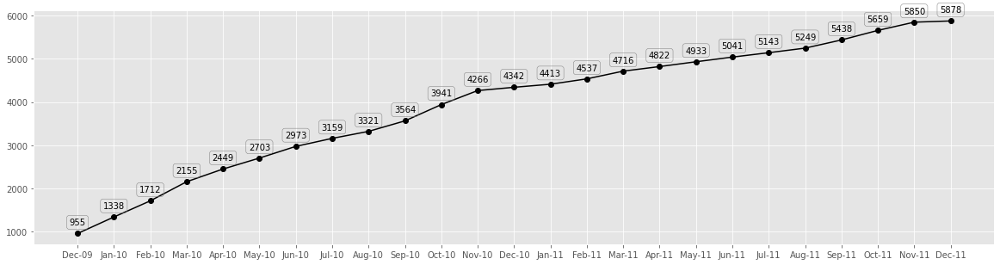

In [30]:
plt.style.use('ggplot')
plt.figure(figsize=(20,5))
plt.plot(customer_by_month.Month_1,customer_by_month.cum_customer,'bo-',color='black')

# zip joins x and y coordinates in pairs
for d,c in zip(customer_by_month['Month_1'],customer_by_month['cum_customer']):

    label = "{:.0f}".format(c)

    plt.annotate(label, 
                 (d,c), 
                 textcoords="offset points"
                 , bbox=dict(boxstyle="round", fc="none", ec="gray")
                 #,arrowprops=dict(arrowstyle="-",connectionstyle="angle,angleA=0,angleB=10,rad=90")
                 ,xytext=(0,10),
                 ha='center') 
plt.show()

del customer_by_month

Customer Acquisition vs Sales contribution

In [31]:
customer_sales = trans_df.groupby(by = ['CustomerID','Year','Quarter'])['Sales'].sum().reset_index()
customer_sales = customer_sales.merge(customer_by_month1[['CustomerID','Quarter_acquisition','Year_acquisition']]
                                      ,on ='CustomerID',how='inner')
customer_sales_acquisition = customer_sales.groupby(by=['Year','Quarter','Year_acquisition','Quarter_acquisition'])['Sales'].sum().reset_index()
customer_sales_acquisition['Sales_Year_quarter'] =customer_sales_acquisition[['Year','Quarter']].apply(lambda row:str(row.Year)+'-'+row.Quarter,axis=1)
customer_sales_acquisition['Acquisition_Year_quarter'] =customer_sales_acquisition[['Year_acquisition','Quarter_acquisition']].apply(lambda row:str(row.Year_acquisition)+'-'+row.Quarter_acquisition,axis=1)
customer_sales_acquisition.drop(columns =['Year','Quarter','Year_acquisition','Quarter_acquisition'],inplace=True)
df = customer_sales_acquisition.pivot(index='Sales_Year_quarter',columns =['Acquisition_Year_quarter']).fillna(0).reset_index()


fig = go.Figure(data=[
    go.Bar(name='First Order 2010-Q4', x=df.Sales_Year_quarter, y=df.iloc[:,1],marker_color='lightslategrey'),
    go.Bar(name='First Order 2011-Q1', x=df.Sales_Year_quarter, y=df.iloc[:,2],marker_color='lightblue'),
    go.Bar(name='First Order 2011-Q2', x=df.Sales_Year_quarter, y=df.iloc[:,3],marker_color='seagreen'),
    go.Bar(name='First Order 2011-Q3', x=df.Sales_Year_quarter, y=df.iloc[:,4],marker_color='orange')
])
fig.update_layout(barmode='stack',template='ggplot2')
fig.show(renderer="colab")

del [customer_sales_acquisition, df,customer_sales]

**Repeat Purchases**

In [32]:
cust_date =trans_df.loc[~trans_df.CustomerID.isna(),['CustomerID','Date']].drop_duplicates()
cust_date.sort_values(by=['CustomerID','Date'],inplace=True)
cust_date['rnk'] = cust_date.groupby(by='CustomerID')['Date'].transform('rank', method='dense')
cust_date = cust_date[cust_date.rnk<=2]
cust_date['Purchase'] = cust_date.rnk.map({1:'First Purchase',2:'Second Purchase'})

cust_purchase= cust_date.pivot(index='CustomerID',columns=['Purchase'],values='Date').reset_index()

cust_purchase['gap']=(cust_purchase['Second Purchase']- cust_purchase['First Purchase'])/ np.timedelta64(30, 'D')
cust_purchase['gap'] = cust_purchase['gap'].fillna(0).apply(lambda x:ceil(x))

days = pd.TimedeltaIndex(cust_purchase['First Purchase'].dt.day,unit="D")

cust_purchase['First_Purchase_month']=cust_purchase['First Purchase']- days+pd.DateOffset(days=1)
cust_purchase_grid = cust_purchase.pivot_table(index=['First_Purchase_month'],columns =['gap'],values='CustomerID',aggfunc='count').fillna(0)
cust_purchase_grid = cust_purchase_grid.sort_index( ascending=False)

fig = go.Figure(data=go.Heatmap(z=cust_purchase_grid
                                ,y=cust_purchase_grid.index,
                   x=cust_purchase_grid.columns.tolist(),
                   hoverongaps = True,colorscale='balance'))
fig.update_xaxes(side="top",showticklabels = True,ticktext= cust_purchase_grid.columns.tolist())
fig.update_layout(height=600,width=800,xaxis_title="Future Month of next Purchase after making first purchase"
                  ,yaxis_title="Month of 1st Purchase",
           yaxis=dict(autorange='reversed',showticklabels = True)
                  ,autosize=False,template='ggplot2')

fig.show(renderer="colab")

del [cust_date,cust_purchase,days,cust_purchase_grid]

**Hypothetical Testing**

In [33]:
sales_by_hour = trans_df.groupby(by='Hour')['Sales'].mean().reset_index()
sales_by_weekday = trans_df.groupby(by='weekday')['Sales'].mean().reset_index()

fig = make_subplots(rows=1, cols=2,subplot_titles=("Avg Hourly Sales", "Avg Sales by Weekday"))
fig.add_trace(go.Bar(y=sales_by_hour.Hour, x=sales_by_hour.Sales,orientation='h'),row=1, col=1)
fig.add_trace(go.Bar(x=sales_by_weekday.weekday, y=sales_by_weekday.Sales),row=1, col=2)
fig.update_layout(height=700, width=800,template='ggplot2')
fig.update_xaxes(title_text="Sales", row=1, col=1)
fig.update_xaxes(title_text="Weekday", row=1, col=2)
fig.update_yaxes(title_text="Hours", row=1, col=1)
fig.update_yaxes(title_text="Sales", row=1, col=2)
fig.show(renderer="colab")

del [sales_by_hour,sales_by_weekday]

Hour

In [34]:
from statsmodels.formula.api import ols
import statsmodels.api as sm
model = ols('Sales ~ C(Hour)',data=data).fit()
#ols.summary()
table = sm.stats.anova_lm(model, typ=2)
print(table)
del [table,model]

                sum_sq         df          F  PR(>F)
C(Hour)   3.091409e+08       14.0  431.46505     0.0
Residual  4.831522e+11  9440633.0        NaN     NaN


Weekday

In [35]:
model = ols('Sales ~ C(weekday)',data=data).fit()
#moore_lm.summary()
table = sm.stats.anova_lm(model, typ=2)
print(table)

del [table,model]

                  sum_sq         df           F  PR(>F)
C(weekday)  1.619064e+08        6.0  527.106092     0.0
Residual    4.832994e+11  9440641.0         NaN     NaN


**LRFM**

In [36]:
LRFM = trans_df.groupby('CustomerID').agg(Frequency=pd.NamedAgg(column="Invoice", aggfunc="nunique")
                                        ,Monetary=pd.NamedAgg(column="Sales", aggfunc="sum")).reset_index()

length = trans_df.groupby('CustomerID')['Date'].max() - trans_df.groupby('CustomerID')['Date'].min()
length =  (length/np.timedelta64(1, 'D')).reset_index()
length.columns = ['CustomerID','Length_of_stay']
LRFM = LRFM.merge(length,on='CustomerID',how='inner')
del length

LRFM.head()

,CustomerID,Frequency,Monetary,Length_of_stay
0,12346.0,12,77556.46,400.0
1,12347.0,8,5633.32,402.0
2,12348.0,5,2019.40,363.0
3,12349.0,4,4428.69,571.0
4,12350.0,1,334.40,0.0


**3 D View of Sales vs Length of Stay vs Frequency**

In [37]:
fig = go.Figure(data=[go.Scatter3d(x=LRFM.Monetary,y=LRFM.Length_of_stay,z=LRFM.Frequency,mode='markers'
                                   ,marker=dict(size=4,color='coral',colorscale='Viridis',opacity=0.8))])
fig.update_layout(margin=dict(l=1, r=2, b=1, t=1)
                  ,scene=dict(xaxis=dict(title='Sales')
                              ,yaxis=dict(title='Lenght of Stay')
                              ,zaxis=dict(title='Frequency')),width=800,height=500)
fig.show(renderer="colab")

**Segmentation**

In [38]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.manifold import TSNE

In [39]:
X=LRFM.drop(columns = 'CustomerID')
error = []
silhouette = []
np.random.seed(12)
rng = range(2,20)
for i in rng:
    km = KMeans(n_clusters=i, init='random',n_init=20, max_iter=200,tol=.0001, random_state=12)
    km.fit(X)
    error.append(km.inertia_)
    lbls = km.fit_predict(X)
    silhouette.append(silhouette_score(X, lbls))

fig = make_subplots(rows=1, cols=2,subplot_titles=("Number of Cluster vs Error", "Number of Cluster vs Silhouette"))
fig.add_trace(go.Scatter(x=list(rng), y=error),row=1, col=1)
fig.add_trace(go.Scatter(x=list(rng), y=silhouette),row=1, col=2)
fig.update_layout(height=500, width=800,template='ggplot2')
fig.update_xaxes(title_text="Number of Clusters", row=1, col=1)
fig.update_xaxes(title_text="Number of Clusters", row=1, col=2)
fig.update_yaxes(title_text="Errors", row=1, col=1)
fig.update_yaxes(title_text="Silhouette Distance", row=1, col=2)
fig.show(renderer="colab")

del [error,silhouette,rng,km,lbls,X]

Create Clusters

In [40]:
X=LRFM.drop(columns = 'CustomerID')
cluster_lbls = KMeans(n_clusters=10, random_state=12).fit_predict(X)
X['cluster'] = cluster_lbls
X['sample_silhouette_values'] = silhouette_samples(X, cluster_lbls)
X['txt']=X.cluster.apply(lambda x:'Cluster '+str(x))

Silhoutee vs Sample

In [41]:
fig = go.Figure(data=go.Scatter(x=X.Monetary,y=X.sample_silhouette_values
                                , mode='markers',marker_color=X.cluster,text = X.txt))

fig.update_layout(xaxis_title="Sales",yaxis_title="Silhouette"
                  ,title='Sample Size vs Silhoutte Values')

fig.show(renderer="colab")

**Clustering Profile**

In [42]:
df = X.groupby('cluster').agg({'cluster':'size', 'Monetary':'mean','Frequency':'mean','Length_of_stay':'mean'}) \
       .rename(columns={'cluster':'Size','Monetary':'Avg Sales','Frequency':'Avg Recency','Length_of_stay':'Avg Lenght of Stay'}) \
       .reset_index().sort_values(by = 'Avg Sales')

cluster_map ={'Cluster 4':'lightskyblue','Cluster 0':'lightskyblue','Cluster 8':'lightskyblue'
              ,'Cluster 6':'lightskyblue','Cluster 2':'lightskyblue',
             'Cluster 3':'orange','Cluster 7':'orange','Cluster 9':'orange'
              ,'Cluster 1':'olive','Cluster 5':'olive'}

txt =['Size = {0:.0f}'.format(i) for i in df.Size]
df['cluster']=df.cluster.apply(lambda x:'Cluster '+str(x))
df['Group']=df.cluster.map(cluster_map)

fig = make_subplots(rows=1, cols=3,subplot_titles=("Avg Sales", "Avg Recency",'Avg Lenght of Stay'))

fig.add_trace(go.Bar(y=df.cluster, x=df['Avg Sales'],hovertext=txt
                        ,text=txt,textposition='auto',marker_color=df.Group,orientation='h'),row=1, col=1)
fig.add_trace(go.Bar(y=df.cluster, x=df['Avg Recency'],hovertext=txt
                        ,text=txt,textposition='auto',marker_color=df.Group,orientation='h'),row=1, col=2)
fig.add_trace(go.Bar(y=df.cluster, x=df['Avg Lenght of Stay'],hovertext=txt
                        ,text=txt,textposition='auto',marker_color=df.Group,orientation='h'),row=1, col=3)

fig.update_traces(marker_line_color='rgb(8,48,107)', marker_line_width=1.5, opacity=0.8)
fig.update_layout(title_text='Cluster Size',width = 800,height=600,template='ggplot2'
                  ,font=dict(family="Courier New, monospace",size=10,color="RebeccaPurple"))

fig.show(renderer="colab")

  3D View of Clusters

In [43]:
fig = go.Figure(data=[go.Scatter3d(x=X.Monetary,y=X.Length_of_stay,z=X.Frequency,mode='markers'
                                   ,marker=dict(size=4,color=X.cluster
                                                ,colorscale='Viridis',opacity=0.8))])

# tight layout
fig.update_layout(margin=dict(l=1, r=2, b=1, t=1)
                  ,scene=dict(xaxis=dict(title='Sales')
                              ,yaxis=dict(title='Lenght of Stay')
                              ,zaxis=dict(title='Recency')),width=700,height=500)
fig.show(renderer="colab")

Bivariate view of by Segment

In [44]:
fig = go.Figure(data=go.Scatter(x=X.Monetary,y=X.Length_of_stay
                                , mode='markers',marker_color=X.cluster,text=X.txt))
fig.update_layout(xaxis_title="Sales",yaxis_title="Length of Stay",title='Sales vs Length of Stay'
                  ,width=800,height=500)
fig.show(renderer="colab")

In [45]:
fig = go.Figure(data=go.Scatter(x=X.Monetary,y=X.Frequency
                                , mode='markers',marker_color=X.cluster,text=X.txt))
fig.update_layout(xaxis_title="Sales",yaxis_title="Frequency",title='Sales vs Frequency'
                  ,width=800,height=500)
fig.show(renderer="colab")

**t-distributed Stochastic Neighbor Embedding**

In [46]:
prpxlt = [10,15,30,40]
fig = make_subplots(rows=2, cols=2,subplot_titles=['perplexity = %s'%i for i in prpxlt])

for i, prpxlt_ in enumerate(prpxlt):
    X_tsne = TSNE(n_components=2, init='random',
                         random_state=0, perplexity=prpxlt_).fit_transform(X[['Frequency', 'Monetary', 'Length_of_stay']])
    if i%2==0:
        c=2
    else:
        c=1
    r = (i)//2+1
    fig.add_trace(go.Scatter(x=X_tsne[:,0],y=X_tsne[:,1]
                                    , mode='markers',marker=dict(size=4,color=X.cluster
                                                ,colorscale='Viridis',opacity=0.8),text=X.txt),row=r, col=c)

    fig.update_xaxes(title_text="Component 1", row=r, col=c)
    fig.update_yaxes(title_text="Component 2", row=r, col=c)
    
fig.update_layout(height=600, width=800)
fig.show(renderer="colab")

del [X_tsne,fig]

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



Time series forecasting

In [47]:
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_pacf,plot_acf

In [48]:
ds_weekly = trans_df.groupby(by=['Year','Week'])['Sales'].sum().reset_index()
ds_daily = trans_df.groupby(by=['Date'])['Sales'].sum().reset_index()

In [49]:
def plot_(t_train,t_test,x_train,x_test,x_train_pred,x_test_pred,forecast,title='Weekly'):
    xt = (max(t_test)+np.arange(len(forecast)))+1
    fig_train=go.Scatter(name='Train : Actual ',x=t_train,y=x_train,showlegend=True)
    fig_trian_pred=go.Scatter(name='Train : Predict',x=t_train,y=x_train_pred,showlegend=True)
    fig_test=go.Scatter(name='Test : Actual',x=t_test,y=x_test,showlegend=True)
    fig_test_pred=go.Scatter(name='Test : Predict',x=t_test,y=x_test_pred,showlegend=True)
    fig_forecast=go.Scatter(name='Forecast',x=xt,y=forecast,showlegend=True)

    fig = go.Figure([fig_train,fig_trian_pred,fig_test,fig_test_pred,fig_forecast])
    fig.update_layout(xaxis_title=title,yaxis_title="Sales",title=title +' Trend'
                      ,height=400,hovermode="x",template='ggplot2')
    fig.show(renderer="colab")

Weekly:Trend

In [50]:
fig = go.Figure(data=[go.Scatter(x=ds_weekly.index,y=ds_weekly.Sales)])
fig.update_layout(xaxis_title="Week",yaxis_title="Sales",title='Weekly Trend',height=400,template='ggplot2')
fig.show(renderer="colab")

Weekly: Test of Stationarity of Actual Series

In [51]:
output = adfuller(ds_weekly.Sales)
print('***************************Week*********************************')
print('ADF Statistic: {0:.2f} and P value:{1:.5f}'.format(*output))
print("As we can see the p value is extreemly high which indicates that we are fail to reject null hypothesis " \
      "and can conclude that series is not stationary ")

***************************Week*********************************
ADF Statistic: -1.47 and P value:0.54584
As we can see the p value is extreemly high which indicates that we are fail to reject null hypothesis and can conclude that series is not stationary 


Weekly: Test of Stationarity with 1 differencing of series

In [52]:
d=1
print('***************************Week*********************************')
# series = ds.Sales
series = ds_weekly.Sales.diff(d)# - ds.Sales.rolling(window=12).mean()
series = series.dropna()
output = adfuller(series)

print('ADF Statistic: {0:.2f} and P value:{1:.5f}'.format(*output))
print("As we can see the p value is close to zero which is less than .05 hence we reject null hypothesis and conclude " \
      " that series is stationary with rolling mean difference at lag of 12 ")

***************************Week*********************************
ADF Statistic: -9.38 and P value:0.00000
As we can see the p value is close to zero which is less than .05 hence we reject null hypothesis and conclude  that series is stationary with rolling mean difference at lag of 12 


Weekly: PACF & ACF

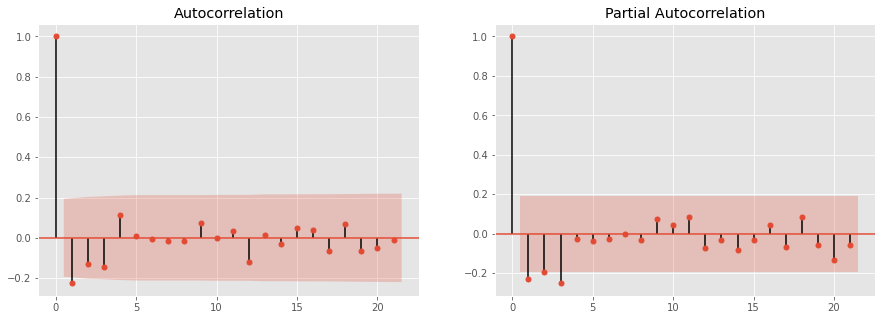

In [53]:
fig, ax = plt.subplots(1,2,figsize=(15,5))
plot_acf(series, ax=ax[0])
plot_pacf(series, ax=ax[1])
plt.show()

**Weekly: Train & Test Split**

In [54]:
series=ds_weekly.Sales
split_time = 45
time=np.arange(len(ds_weekly))
xtrain=series[:split_time]
xtest=series[split_time:]
timeTrain = time[:split_time]
timeTest = time[split_time:]
print('Full Set Size ',series.shape)
print('Training Set Size ',xtrain.shape)
print('Testing Set Size ',xtest.shape)

Full Set Size  (104,)
Training Set Size  (45,)
Testing Set Size  (59,)


In [55]:
!pip install statsmodels==0.12.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [56]:
import statsmodels.api as sm

In [57]:
!pip3 install --user scipy==1.2.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [58]:
from statsmodels.tsa.arima.model import ARIMA
model = ARIMA(xtrain, order=(1,1,2))
model_fit = model.fit()
print(model_fit.summary())

                               SARIMAX Results                                
Dep. Variable:                  Sales   No. Observations:                   45
Model:                 ARIMA(1, 1, 2)   Log Likelihood                -534.314
Date:                Wed, 20 Jul 2022   AIC                           1076.627
Time:                        09:01:59   BIC                           1083.764
Sample:                             0   HQIC                          1079.274
                                 - 45                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3402      1.750      0.194      0.846      -3.090       3.770
ma.L1         -0.8594      1.808     -0.475      0.635      -4.403       2.684
ma.L2          0.0906      1.008      0.090      0.9